In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [2]:
df = pd.read_excel("combined_dataset_ml.xlsx",index_col = 0)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1804 entries, 0 to 1837
Data columns (total 11 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   latitude                          1804 non-null   float64       
 1   longitude                         1804 non-null   float64       
 2   Station                           1804 non-null   object        
 3   Surface_SM(m3m-3)                 1804 non-null   float64       
 4   Surface_Wetness                   1804 non-null   float64       
 5   net_downward_longwave_flux(wm-2)  1804 non-null   float64       
 6   7_day_avg_sm                      1804 non-null   float64       
 7   7_day_avg_evapotranspiration      1804 non-null   float64       
 8   ordinal_date                      1804 non-null   int64         
 9   Observed                          1804 non-null   float64       
 10  Date                              1804 non-null 

In [4]:
stations = df["Station"].unique()
print(stations)
print(len(stations))

['Comilla' 'Joydevpur' 'Dinajpur' 'Rajshahi' 'Srimongal' 'Rangpur'
 'Mymensingh' 'Khulna' 'Ishurdi']
9


In [5]:
import joblib
from tensorflow import keras

In [9]:
rf_model = joblib.load("rf_model_12_10_22.pkl")
gb_model = joblib.load("GB_model_13_10_22.pkl")
dnn_model = keras.models.load_model('DNN_model_best_06_11_2022')

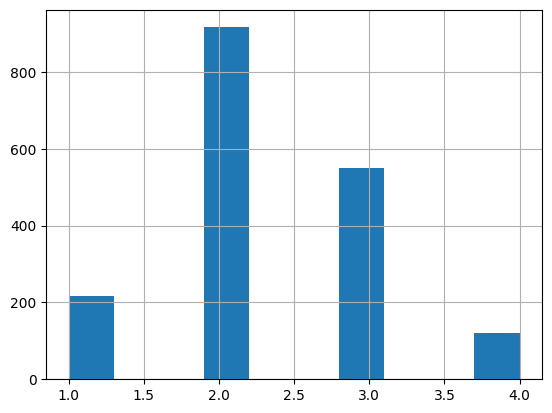

In [10]:
X = df.drop(["Date","Station","7_day_avg_sm","Observed"],axis = 1).copy()
y = df["Observed"].copy()

dataset = df.drop(["Date","Station","7_day_avg_sm"],axis = 1).copy()
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import train_test_split

import numpy as np
dataset["moisture_cat"] = pd.cut(dataset["Observed"],
                        bins=[0.,15., 30., 45.,60.,np.inf],
                        labels=[1, 2, 3, 4,5])
dataset["moisture_cat"].hist()


strat_train_set, strat_test_set = train_test_split(dataset, test_size=0.2, stratify=dataset["moisture_cat"], random_state=42)

for set_ in (strat_train_set, strat_test_set):
    set_.drop("moisture_cat", axis=1, inplace=True)
    
X_train = strat_train_set.drop("Observed", axis=1)
y_train = strat_train_set["Observed"].copy()

X_test = strat_test_set.drop("Observed", axis=1)
y_test = strat_test_set["Observed"].copy()


In [11]:
gb_predictions = gb_model.predict(X)
gb_predictions = gb_model.predict(X)
dnn_predictions = dnn_model.predict(X)

57/57 [==============================] - 0s 876us/step


In [12]:
from sklearn.metrics import mean_squared_error
from scipy.stats import pearsonr


RF model

In [13]:
rf_model.fit(X_train, y_train)

training_predictions_rf = rf_model.predict(X_train)
training_rmse_rf = mean_squared_error(y_train, training_predictions_rf, squared = False)

testing_predictions_rf = rf_model.predict(X_test)
testing_rmse_rf = mean_squared_error(y_test, testing_predictions_rf, squared = False)

training_r_rf,_ = pearsonr(y_train,training_predictions_rf  )
training_r_square_rf = np.square(training_r_rf)

testing_r_rf,_ = pearsonr(y_test,testing_predictions_rf  )
testing_r_square_rf = np.square(testing_r_rf)


GB model

In [14]:
gb_model.fit(X_train, y_train)

training_predictions_gb = gb_model.predict(X_train)
training_rmse_gb = mean_squared_error(y_train, training_predictions_gb, squared = False)

testing_predictions_gb = gb_model.predict(X_test)
testing_rmse_gb = mean_squared_error(y_test, testing_predictions_gb, squared = False)

training_r_gb,_ = pearsonr(y_train,training_predictions_gb  )
training_r_square_gb = np.square(training_r_gb)

testing_r_gb,_ = pearsonr(y_test,testing_predictions_gb  )
testing_r_square_gb = np.square(testing_r_gb)

DNN model

In [15]:
import tensorflow as tf
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    filepath="Checkpoints",
    save_weights_only=True,
    monitor='val_root_mean_squared_error',
    mode='min',
    save_best_only=True)
early_stopping_cb = tf.keras.callbacks.EarlyStopping(monitor = "val_root_mean_squared_error",patience=100,restore_best_weights=True)

dnn_model.fit(X_train, y_train, epochs=500, validation_split = 0.2, callbacks=[checkpoint_cb, early_stopping_cb])


training_predictions_dnn = dnn_model.predict(X_train)
training_rmse_dnn = mean_squared_error(y_train, training_predictions_dnn, squared = False)

testing_predictions_dnn = dnn_model.predict(X_test)
testing_rmse_dnn = mean_squared_error(y_test, testing_predictions_dnn, squared = False)

training_r_dnn,_ = pearsonr(y_train,training_predictions_dnn  )
training_r_square_dnn = np.square(training_r_dnn)

testing_r_dnn,_ = pearsonr(y_test,testing_predictions_dnn  )
testing_r_square_dnn = np.square(testing_r_dnn)

Epoch 1/500
37/37 [==============================] - 1s 7ms/step - loss: 24.0314 - root_mean_squared_error: 4.9022 - val_loss: 20.5410 - val_root_mean_squared_error: 4.5322
Epoch 2/500
37/37 [==============================] - 0s 2ms/step - loss: 15.3343 - root_mean_squared_error: 3.9159 - val_loss: 22.7867 - val_root_mean_squared_error: 4.7735
Epoch 3/500
37/37 [==============================] - 0s 3ms/step - loss: 15.0321 - root_mean_squared_error: 3.8771 - val_loss: 22.5166 - val_root_mean_squared_error: 4.7452
Epoch 4/500
37/37 [==============================] - 0s 2ms/step - loss: 17.2503 - root_mean_squared_error: 4.1534 - val_loss: 21.2732 - val_root_mean_squared_error: 4.6123
Epoch 5/500
37/37 [==============================] - 0s 3ms/step - loss: 15.5094 - root_mean_squared_error: 3.9382 - val_loss: 32.1660 - val_root_mean_squared_error: 5.6715
Epoch 6/500
37/37 [==============================] - 0s 3ms/step - loss: 23.2677 - root_mean_squared_error: 4.8237 - val_loss: 20.5283 

37/37 [==============================] - 0s 2ms/step - loss: 9.9441 - root_mean_squared_error: 3.1534 - val_loss: 27.2599 - val_root_mean_squared_error: 5.2211
Epoch 96/500
37/37 [==============================] - 0s 2ms/step - loss: 8.6843 - root_mean_squared_error: 2.9469 - val_loss: 24.0230 - val_root_mean_squared_error: 4.9013
Epoch 97/500
37/37 [==============================] - 0s 2ms/step - loss: 7.7792 - root_mean_squared_error: 2.7891 - val_loss: 25.3908 - val_root_mean_squared_error: 5.0389
Epoch 98/500
37/37 [==============================] - 0s 2ms/step - loss: 8.3415 - root_mean_squared_error: 2.8882 - val_loss: 26.1019 - val_root_mean_squared_error: 5.1090
Epoch 99/500
37/37 [==============================] - 0s 2ms/step - loss: 8.3653 - root_mean_squared_error: 2.8923 - val_loss: 23.7579 - val_root_mean_squared_error: 4.8742
Epoch 100/500
37/37 [==============================] - 0s 2ms/step - loss: 8.1186 - root_mean_squared_error: 2.8493 - val_loss: 24.0544 - val_root_m

In [16]:
np.float(training_r_square_dnn)

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\3919431693.py:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  np.float(training_r_square_dnn)


0.880738644420833

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\360818973.py:8: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ax.scatter(y_train, training_predictions_dnn, c = 'darkcyan', label = "Deep Neural Network "+"("+"$R^2$ = {:.2f}".format(np.float(training_r_square_dnn))+" " +"RMSE = {:.2f}".format(training_rmse_dnn)+")", alpha = 0.3)


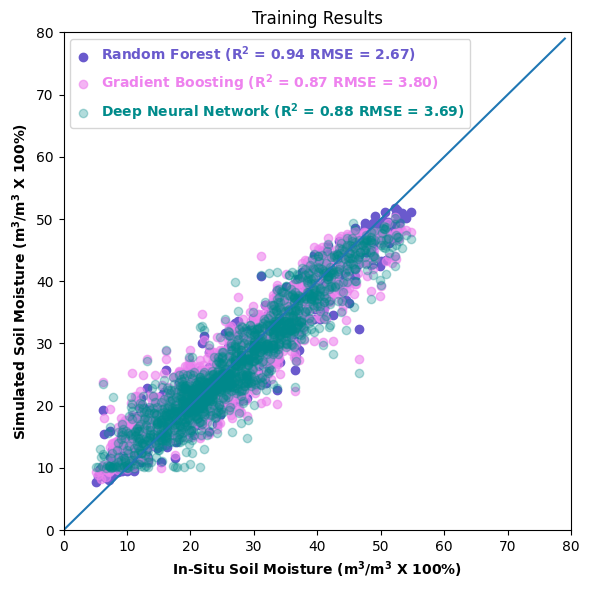

In [34]:
plt.rcParams["figure.figsize"] = [6,6 ]
plt.rcParams.update({'mathtext.default':  'regular' })

fig, ax = plt.subplots(1)

ax.scatter(y_train, training_predictions_rf, c = 'slateblue', label = "Random Forest "+"("+"$R^2$ = {:.2f}".format(training_r_square_rf)+" " +"RMSE = {:.2f}".format(training_rmse_rf)+")") 
ax.scatter(y_train, training_predictions_gb, c = 'violet', label = "Gradient Boosting "+"("+"$R^2$ = {:.2f}".format(training_r_square_gb)+" " +"RMSE = {:.2f}".format(training_rmse_gb)+")", alpha = 0.6)
ax.scatter(y_train, training_predictions_dnn, c = 'darkcyan', label = "Deep Neural Network "+"("+"$R^2$ = {:.2f}".format(np.float(training_r_square_dnn))+" " +"RMSE = {:.2f}".format(training_rmse_dnn)+")", alpha = 0.3)

color_list = ["slateblue","violet","darkcyan"]
ax.set_xlim(0,80)
ax.set_ylim(0,80)
ax.plot(range(0,80), range(0,80))
ax.set_xlabel("In-Situ Soil Moisture ($m^3$/$m^3$ X 100%)", fontweight = 'semibold')
ax.set_ylabel("Simulated Soil Moisture ($m^3$/$m^3$ X 100%)",fontweight = 'semibold')
ax.legend(labelcolor=color_list, prop=dict(weight='bold'), fontsize = "small", handlelength = 1)

# #rf model
# ax.annotate("$R^2$ = {:.2f}".format(training_r_square_rf), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.03, 0.82), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "slateblue")
# ax.annotate("RMSE = {:.2f}".format(training_rmse_rf), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.3, 0.82), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "slateblue")

# #gb model
# ax.annotate("$R^2$ = {:.2f}".format(training_r_square_gb), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.03, 0.76), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "violet")
# ax.annotate("RMSE = {:.2f}".format(training_rmse_gb), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.3, 0.76), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "violet")

# #DNN model
# ax.annotate("$R^2$ = {:.2f}".format(np.float(training_r_square_dnn)), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.03, 0.70), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "darkcyan")
            
# ax.annotate("RMSE = {:.2f}".format(training_rmse_dnn), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.3, 0.70), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "darkcyan")

ax.set_title("Training Results")
plt.tight_layout()

plt.savefig("Combined_Training_Output_modified.jpg", dpi  = 500)
plt.show()

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1914974225.py:8: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ax.scatter(y_test, testing_predictions_dnn, c = 'darkcyan', label = "Deep Neural Network "+"("+"$R^2$ = {:.2f}".format(np.float(testing_r_square_dnn))+" " +"RMSE = {:.2f}".format(testing_rmse_dnn)+")", alpha = 0.3)


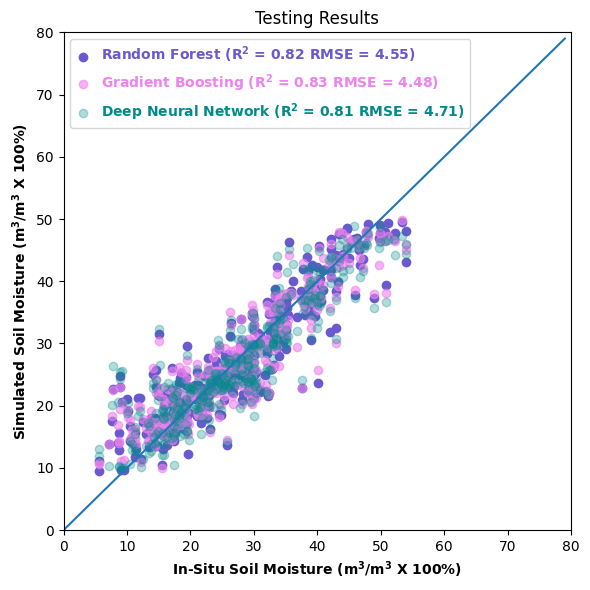

In [36]:
plt.rcParams["figure.figsize"] = [6,6 ]
plt.rcParams.update({'mathtext.default':  'regular' })

fig, ax = plt.subplots(1)

ax.scatter(y_test, testing_predictions_rf, c = 'slateblue', label = "Random Forest "+"("+"$R^2$ = {:.2f}".format(testing_r_square_rf)+" " +"RMSE = {:.2f}".format(testing_rmse_rf)+")") 
ax.scatter(y_test, testing_predictions_gb, c = 'violet', label = "Gradient Boosting "+"("+"$R^2$ = {:.2f}".format(testing_r_square_gb)+" " +"RMSE = {:.2f}".format(testing_rmse_gb)+")", alpha = 0.6)
ax.scatter(y_test, testing_predictions_dnn, c = 'darkcyan', label = "Deep Neural Network "+"("+"$R^2$ = {:.2f}".format(np.float(testing_r_square_dnn))+" " +"RMSE = {:.2f}".format(testing_rmse_dnn)+")", alpha = 0.3)

color_list = ["slateblue","violet","darkcyan"]


ax.set_xlim(0,80)
ax.set_ylim(0,80)
ax.plot(range(0,80), range(0,80))
ax.set_xlabel("In-Situ Soil Moisture ($m^3$/$m^3$ X 100%)", fontweight = 'semibold')
ax.set_ylabel("Simulated Soil Moisture ($m^3$/$m^3$ X 100%)",fontweight = 'semibold')
ax.legend(labelcolor=color_list, prop=dict(weight='bold'), fontsize = "small", handlelength = 1)

# ax.annotate("RF  $R^2$ = {:.2f}".format(testing_r_square_rf), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.03, 0.82), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "slateblue")
# ax.annotate("RMSE = {:.2f}".format(testing_rmse_rf), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.3, 0.82), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "slateblue")

# ax.annotate("GB  $R^2$ = {:.2f}".format(testing_r_square_gb), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.03, 0.76), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "violet")
# ax.annotate("RMSE = {:.2f}".format(testing_rmse_gb), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.3, 0.76), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "violet")

# ax.annotate("DNN  $R^2$ = {:.2f}".format(np.float(testing_r_square_dnn)), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.03, 0.70), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "darkcyan")
            
# ax.annotate("RMSE = {:.2f}".format(testing_rmse_dnn), xy=(0.07,0.965),  xycoords='axes fraction',
#         xytext=(0.3, 0.70), textcoords='axes fraction',

#         horizontalalignment='left', verticalalignment='top', fontweight = 'semibold', color = "darkcyan")

ax.set_title("Testing Results")
plt.tight_layout()

plt.savefig("Combined_Testing_Output_modified.jpg", dpi  = 500)
plt.show()

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2865028378.py:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2865028378.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2865028378.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

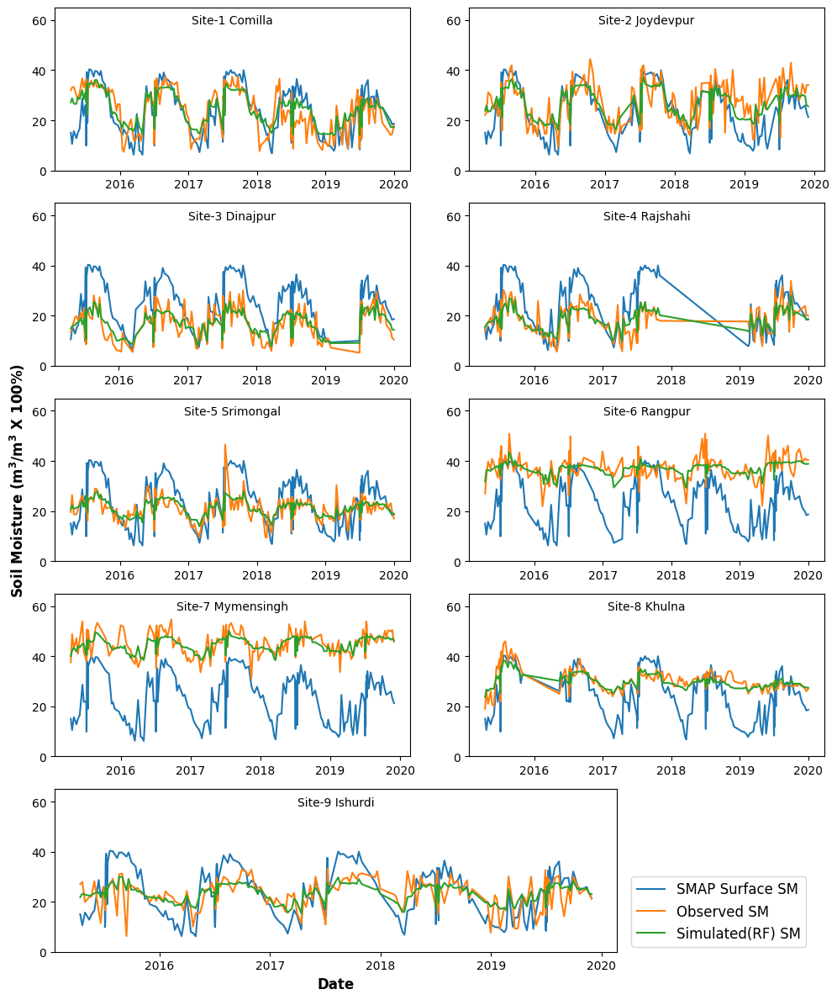

In [40]:
import matplotlib.pyplot as plt

fig,ax = plt.subplots(figsize = (12,12))

ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
ax2 = plt.subplot2grid((5, 5), (0,3),colspan = 2)

ax3 = plt.subplot2grid((5, 5), (1,1),colspan = 2)
ax4 = plt.subplot2grid((5, 5), (1,3),colspan = 2)

ax5 = plt.subplot2grid((5, 5), (2,1),colspan = 2)
ax6 = plt.subplot2grid((5, 5), (2,3),colspan = 2)

ax7 = plt.subplot2grid((5, 5), (3,1),colspan = 2)
ax8 = plt.subplot2grid((5, 5), (3,3),colspan = 2)

ax9 = plt.subplot2grid((5, 5), (4,1),colspan = 3)


# plt.tight_layout()
# ax1.scatter(y,gb_predictions)

# ax2.scatter(y,gb_predictions)

# ax3.scatter(y,gb_predictions)

for i, ax in enumerate(fig.axes):
    filt = df["Station"] == stations[i]
    temp_df = df[filt]
    temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
    var = temp_df.drop(["Date","Station","7_day_avg_sm","Observed","smap"],axis = 1).copy()
    observed = temp_df["Observed"].copy()
    temp_df["sim_rf"] = gb_model.predict(var)


    temp_df.set_index("Date", inplace = True)
    temp_df.sort_index(inplace = True)

    ax.plot(temp_df["smap"], label = "SMAP Surface SM")
    ax.plot(temp_df["Observed"], label = "Observed SM")
    ax.plot(temp_df["sim_rf"], label = "Simulated(RF) SM")
    ax.set_ylim([0,65])
    
    if i == 4:
        ax.set_ylabel("Soil Moisture ($m^3$/$m^3$ X 100%)", fontweight = "semibold", fontsize = 12)
    ax.set_title("Site-"+str(i+1)+" "+stations[i], y = 1, pad = -14, fontsize = 10 )


handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right',bbox_to_anchor = (0.97,0.05),fontsize = 12)
plt.xlabel("Date", fontweight = "semibold", fontsize = 12)
plt.savefig("Stationwise_plot_rf.jpg", dpi = 500,bbox_inches = 'tight')

plt.tight_layout()
plt.show()

C:\Users\ASUS\AppData\Local\Temp\ipykernel_6336\2088329628.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_6336\2088329628.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = rf_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_6336\2088329628.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the document

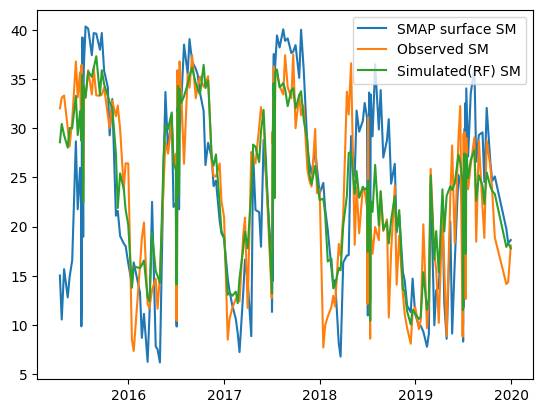

In [46]:
filt = df["Station"] == stations[0]
temp_df = df[filt]
temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
var = temp_df.drop(["Date","Station","7_day_avg_sm","Observed","smap"],axis = 1).copy()
observed = temp_df["Observed"].copy()
temp_df["sim_rf"] = gb_model.predict(var)


temp_df.set_index("Date", inplace = True)
temp_df.sort_index(inplace = True)
fig,ax = plt.subplots(1,1)

ax.plot(temp_df["smap"], label = "SMAP surface SM")
ax.plot(temp_df["Observed"], label = "Observed SM")
ax.plot(temp_df["sim_rf"], label = "Simulated(RF) SM")

figure.add_subplot(111, frame_on=False)
plt.tick_params(labelcolor="none", bottom=False, left=False)

plt.xlabel("Common X-Axis")


C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2828103172.py:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2828103172.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2828103172.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

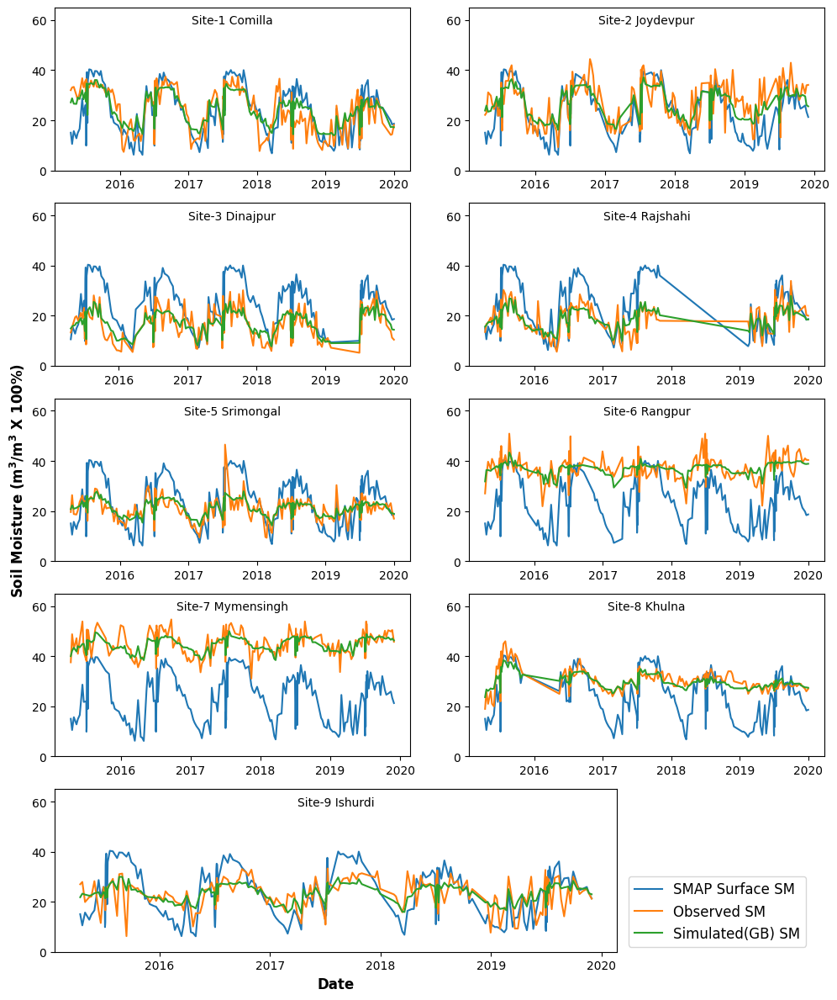

In [43]:
import matplotlib.pyplot as plt

fig,ax = plt.subplots(figsize = (12,12))

ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
ax2 = plt.subplot2grid((5, 5), (0,3),colspan = 2)

ax3 = plt.subplot2grid((5, 5), (1,1),colspan = 2)
ax4 = plt.subplot2grid((5, 5), (1,3),colspan = 2)

ax5 = plt.subplot2grid((5, 5), (2,1),colspan = 2)
ax6 = plt.subplot2grid((5, 5), (2,3),colspan = 2)

ax7 = plt.subplot2grid((5, 5), (3,1),colspan = 2)
ax8 = plt.subplot2grid((5, 5), (3,3),colspan = 2)

ax9 = plt.subplot2grid((5, 5), (4,1),colspan = 3)


# plt.tight_layout()
# ax1.scatter(y,gb_predictions)

# ax2.scatter(y,gb_predictions)

# ax3.scatter(y,gb_predictions)

for i, ax in enumerate(fig.axes):
    filt = df["Station"] == stations[i]
    temp_df = df[filt]
    temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
    var = temp_df.drop(["Date","Station","7_day_avg_sm","Observed","smap"],axis = 1).copy()
    observed = temp_df["Observed"].copy()
    temp_df["sim_gb"] = gb_model.predict(var)


    temp_df.set_index("Date", inplace = True)
    temp_df.sort_index(inplace = True)

    ax.plot(temp_df["smap"], label = "SMAP Surface SM")
    ax.plot(temp_df["Observed"], label = "Observed SM")
    ax.plot(temp_df["sim_gb"], label = "Simulated(GB) SM")
    ax.set_ylim([0,65])
    
    if i == 4:
        ax.set_ylabel("Soil Moisture ($m^3$/$m^3$ X 100%)", fontweight = "semibold", fontsize = 12)
    ax.set_title("Site-"+str(i+1)+" "+stations[i], y = 1, pad = -14, fontsize = 10 )


handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right',bbox_to_anchor = (0.97,0.05),fontsize = 12)
plt.xlabel("Date", fontweight = "semibold", fontsize = 12)
plt.savefig("Stationwise_plot_GB.jpg", dpi = 500,bbox_inches = 'tight')

plt.tight_layout()
plt.show()


6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2184326980.py:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2184326980.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2184326980.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2184326980.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2184326980.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df.sort_index(inplace = True)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2184326980.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pa

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2184326980.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2184326980.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df.sort_index(inplace = True)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13916\2184326980.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pa

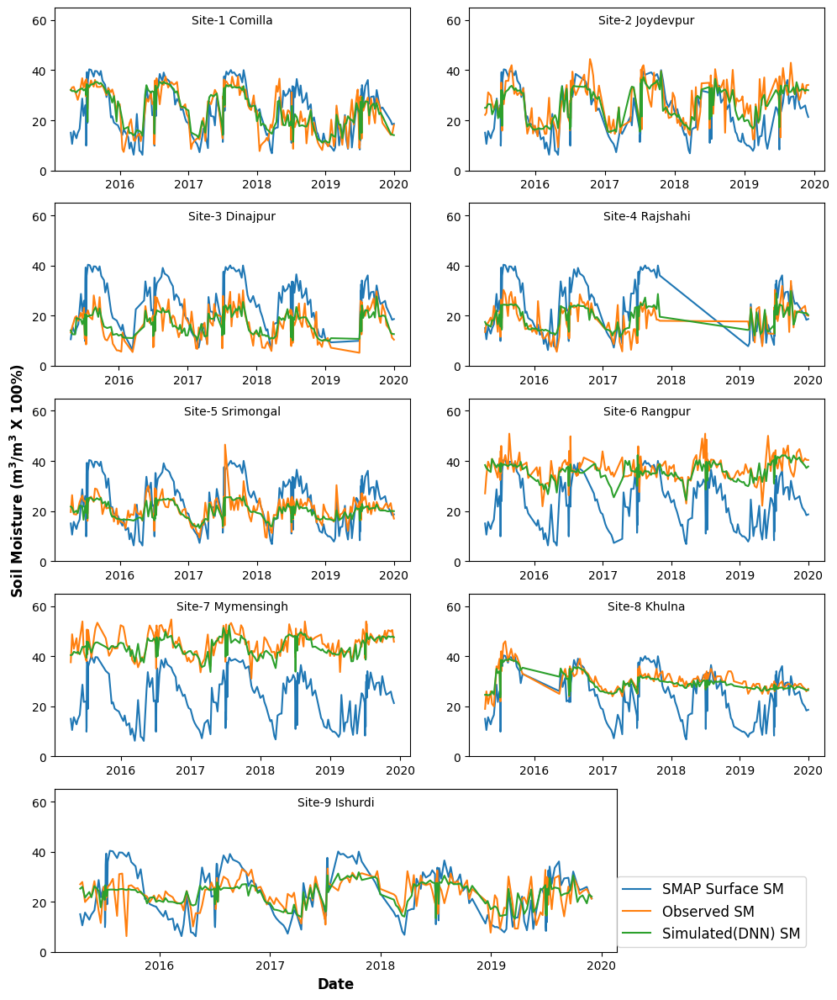

In [44]:
import matplotlib.pyplot as plt

fig,ax = plt.subplots(figsize = (12,12))

ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
ax2 = plt.subplot2grid((5, 5), (0,3),colspan = 2)

ax3 = plt.subplot2grid((5, 5), (1,1),colspan = 2)
ax4 = plt.subplot2grid((5, 5), (1,3),colspan = 2)

ax5 = plt.subplot2grid((5, 5), (2,1),colspan = 2)
ax6 = plt.subplot2grid((5, 5), (2,3),colspan = 2)

ax7 = plt.subplot2grid((5, 5), (3,1),colspan = 2)
ax8 = plt.subplot2grid((5, 5), (3,3),colspan = 2)

ax9 = plt.subplot2grid((5, 5), (4,1),colspan = 3)


# plt.tight_layout()
# ax1.scatter(y,dnn_predictions)

# ax2.scatter(y,dnn_predictions)

# ax3.scatter(y,dnn_predictions)

for i, ax in enumerate(fig.axes):
    filt = df["Station"] == stations[i]
    temp_df = df[filt]
    temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
    var = temp_df.drop(["Date","Station","7_day_avg_sm","Observed","smap"],axis = 1).copy()
    observed = temp_df["Observed"].copy()
    

    temp_df["sim_dnn"] = dnn_model.predict(var)


    temp_df.set_index("Date", inplace = True)
    temp_df.sort_index(inplace = True)

    ax.plot(temp_df["smap"], label = "SMAP Surface SM")
    ax.plot(temp_df["Observed"], label = "Observed SM")
    ax.plot(temp_df["sim_dnn"], label = "Simulated(DNN) SM")
    ax.set_ylim([0,65])
    
    if i == 4:
        ax.set_ylabel("Soil Moisture ($m^3$/$m^3$ X 100%)", fontweight = "semibold", fontsize = 12)
    ax.set_title("Site-"+str(i+1)+" "+stations[i], y = 1, pad = -14, fontsize = 10 )


handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right',bbox_to_anchor = (0.97,0.05),fontsize = 12)
plt.xlabel("Date", fontweight = "semibold", fontsize = 12)
plt.savefig("Stationwise_plot_dnn.jpg", dpi = 500,bbox_inches = 'tight')

plt.tight_layout()
plt.show()


Combined timeseries

1/6 [====>.........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

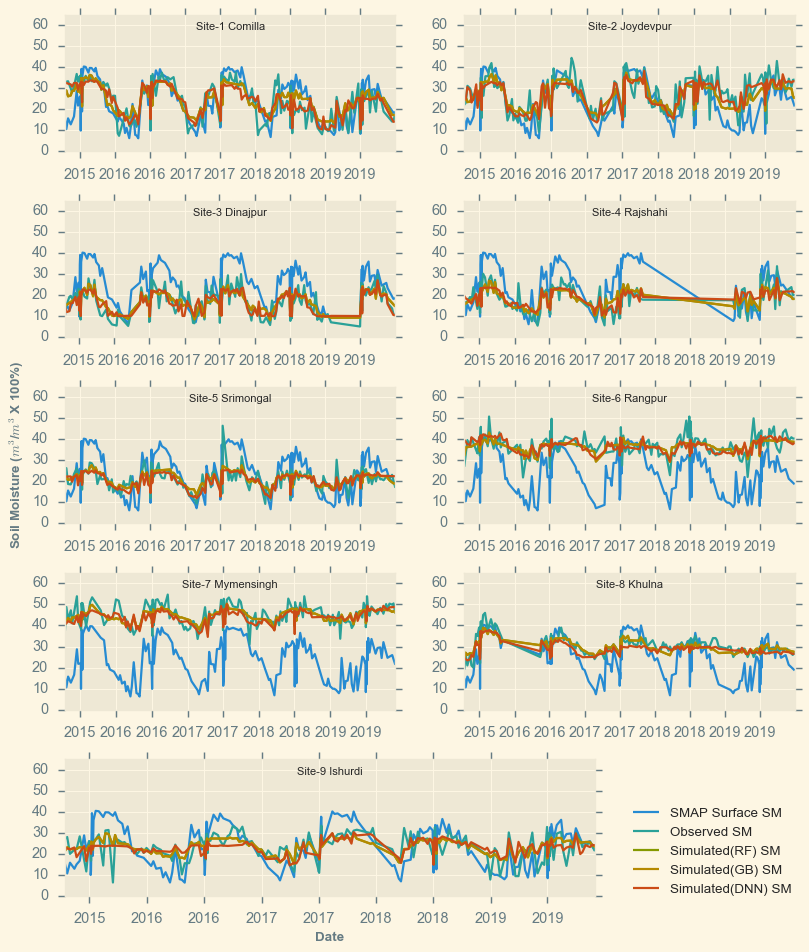

Plotting in:  Solarize_Light2
7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

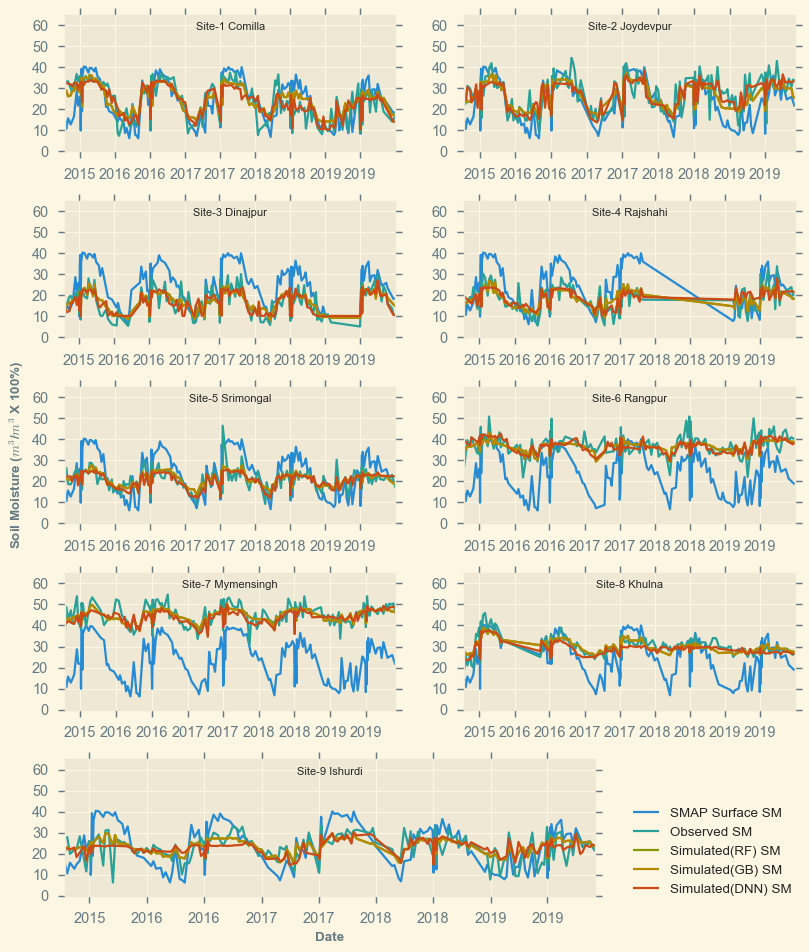

Plotting in:  _classic_test_patch
1/6 [====>.........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

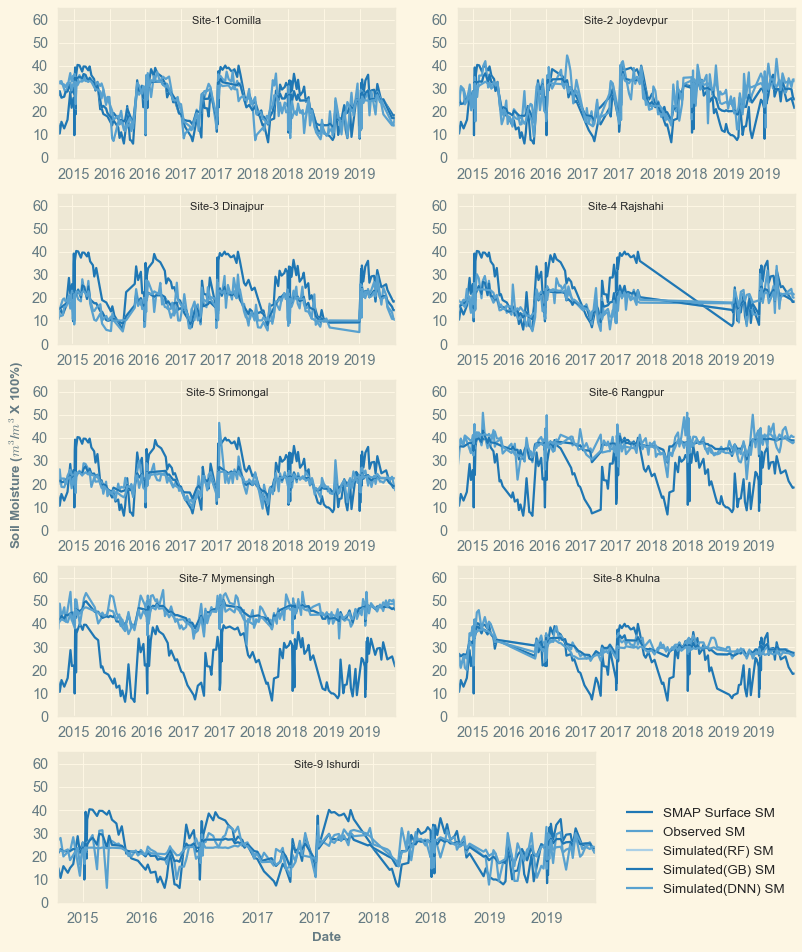

Plotting in:  _mpl-gallery
1/6 [====>.........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 995us/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

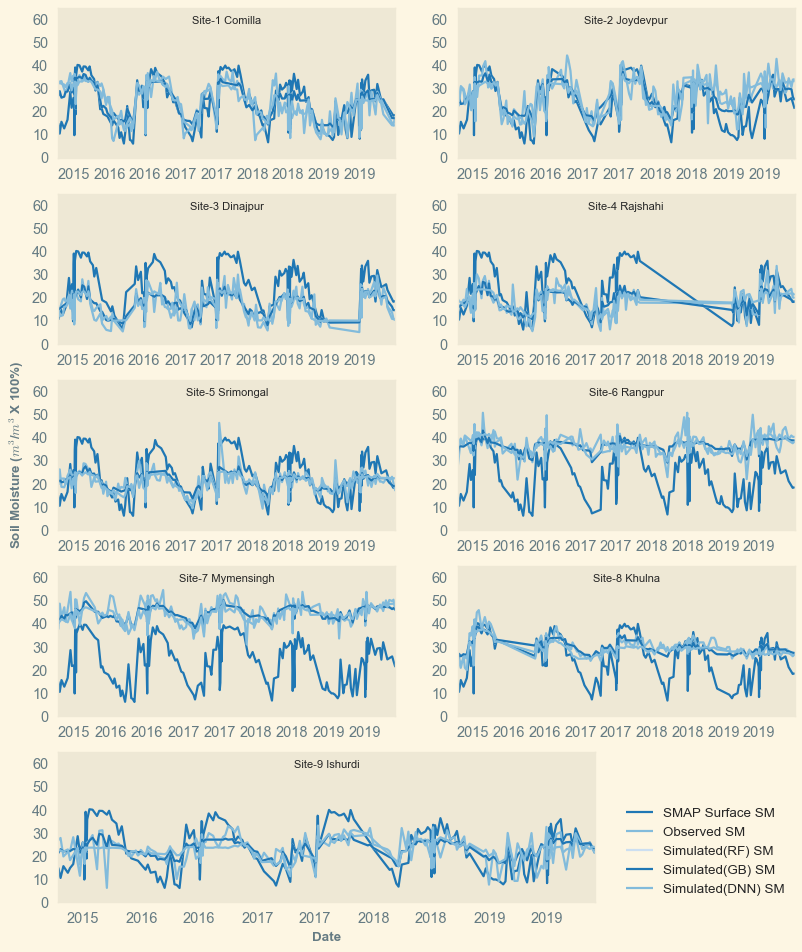

Plotting in:  _mpl-gallery-nogrid
1/6 [====>.........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

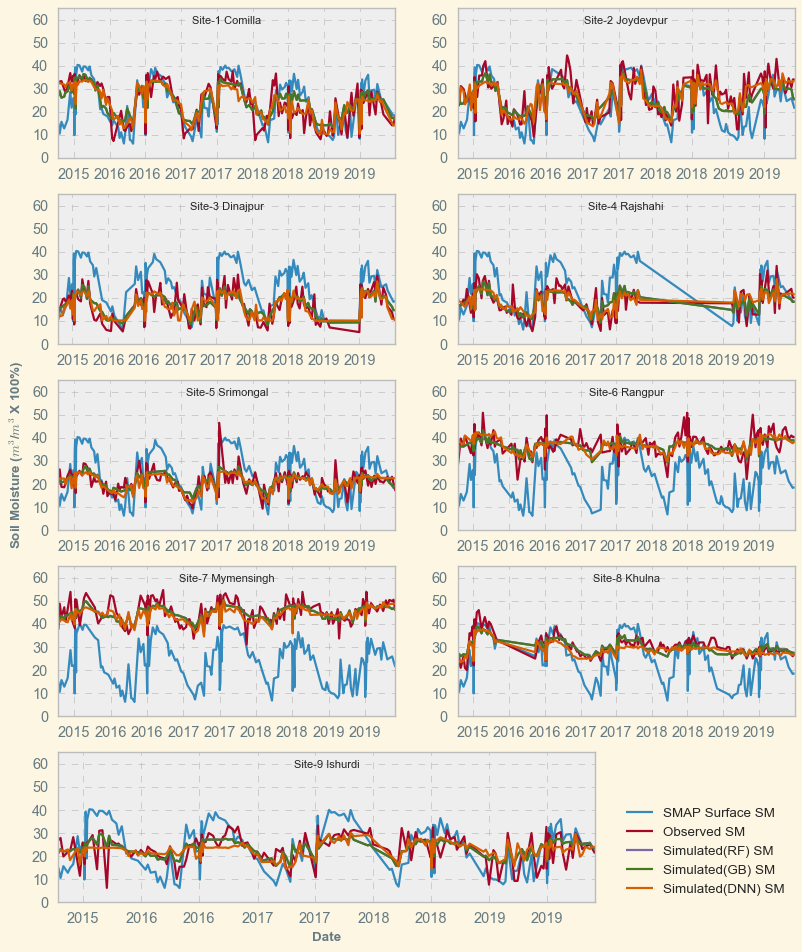

Plotting in:  bmh
1/6 [====>.........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

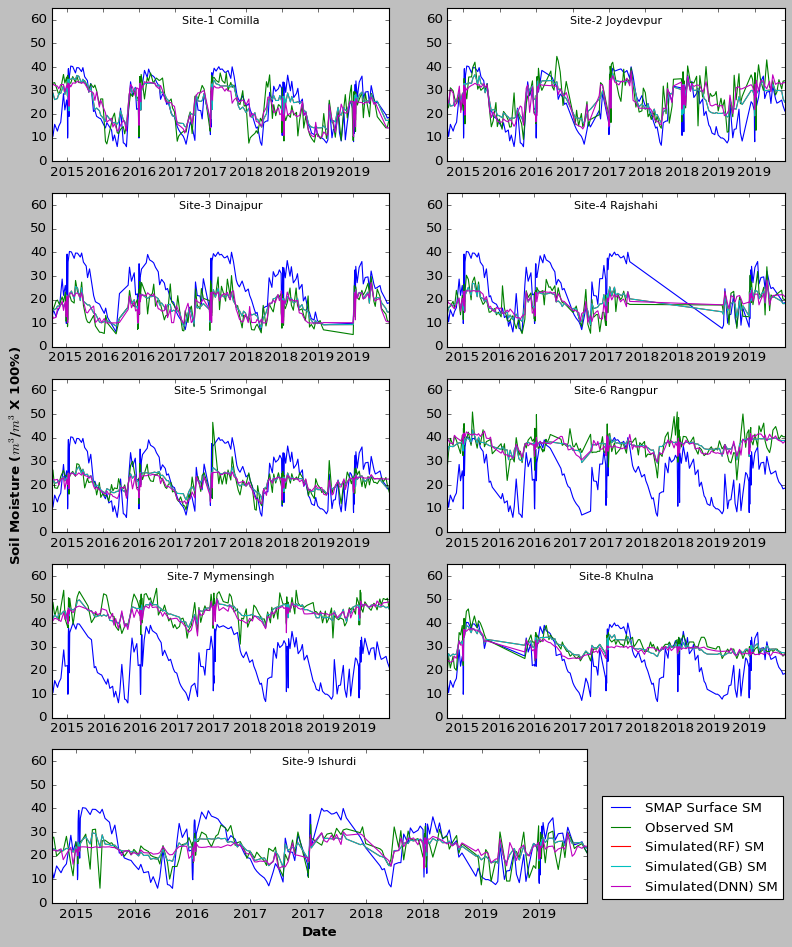

Plotting in:  classic
6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

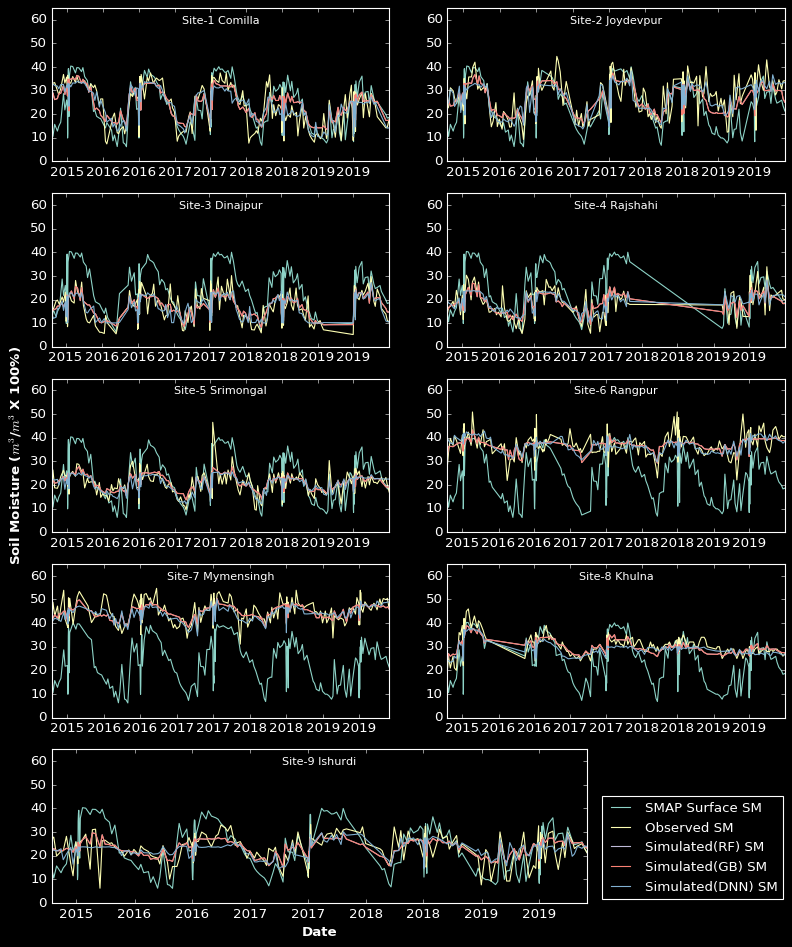

Plotting in:  dark_background
6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

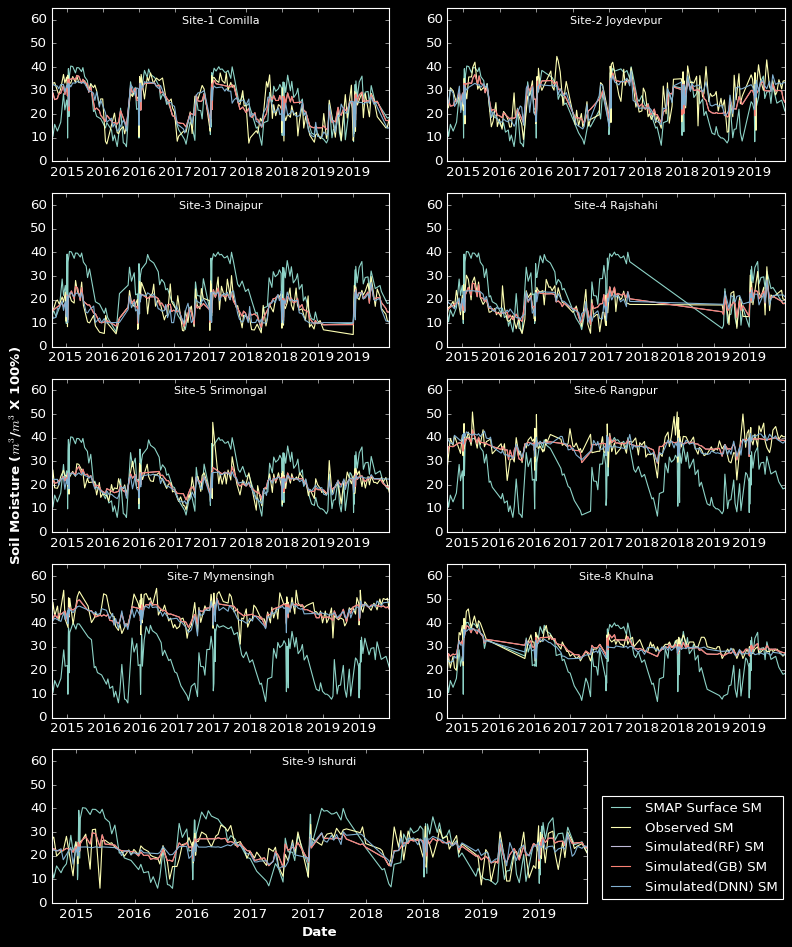

Plotting in:  fast
1/6 [====>.........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

1/7 [===>..........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

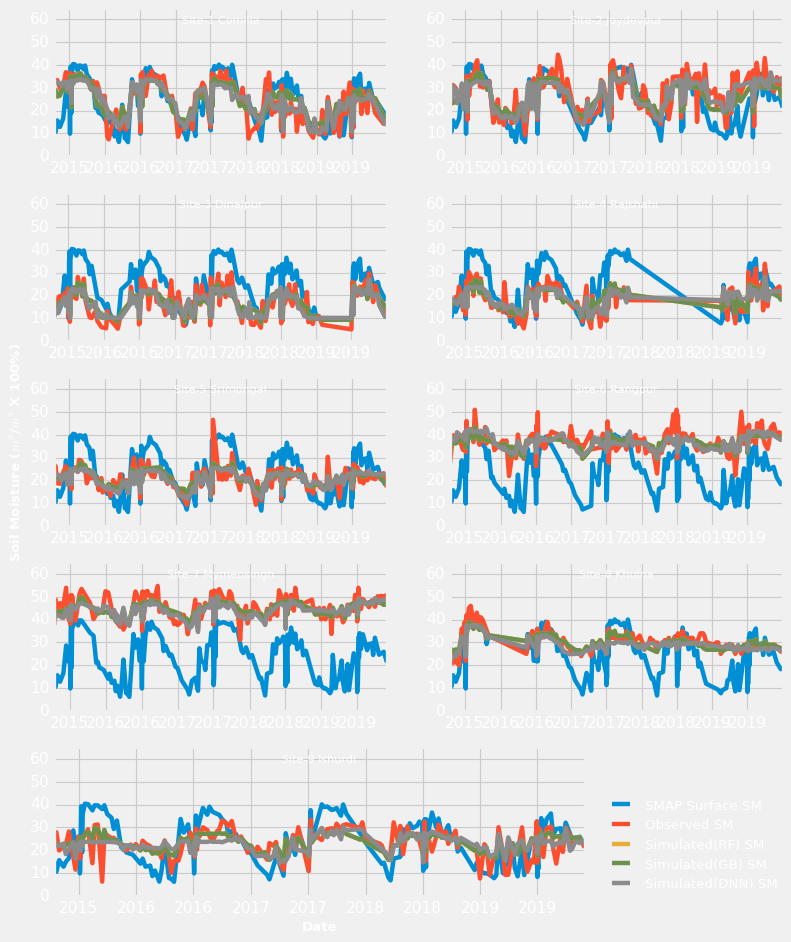

Plotting in:  fivethirtyeight
6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

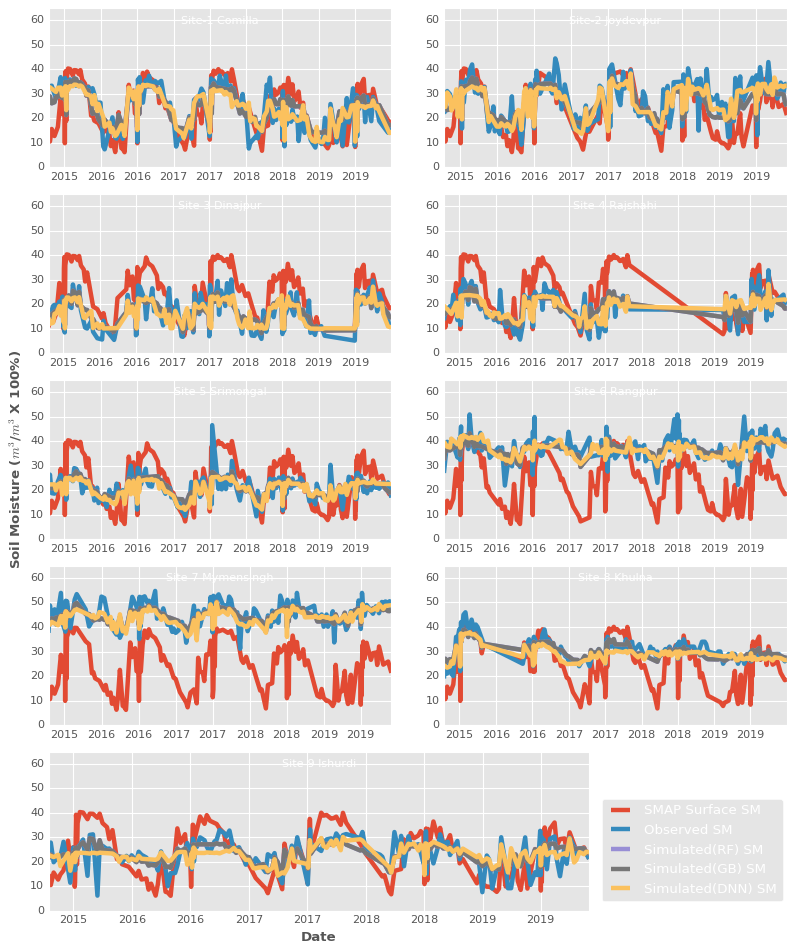

Plotting in:  ggplot
1/6 [====>.........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 2ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

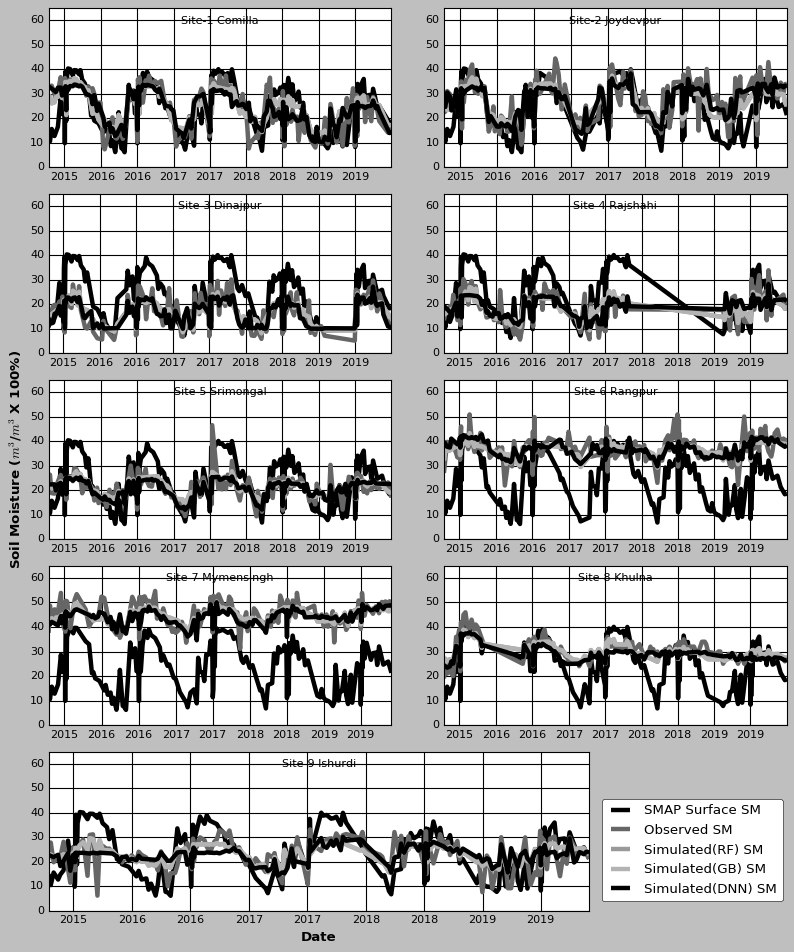

Plotting in:  grayscale
7/7 [==============================] - 0s 2ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

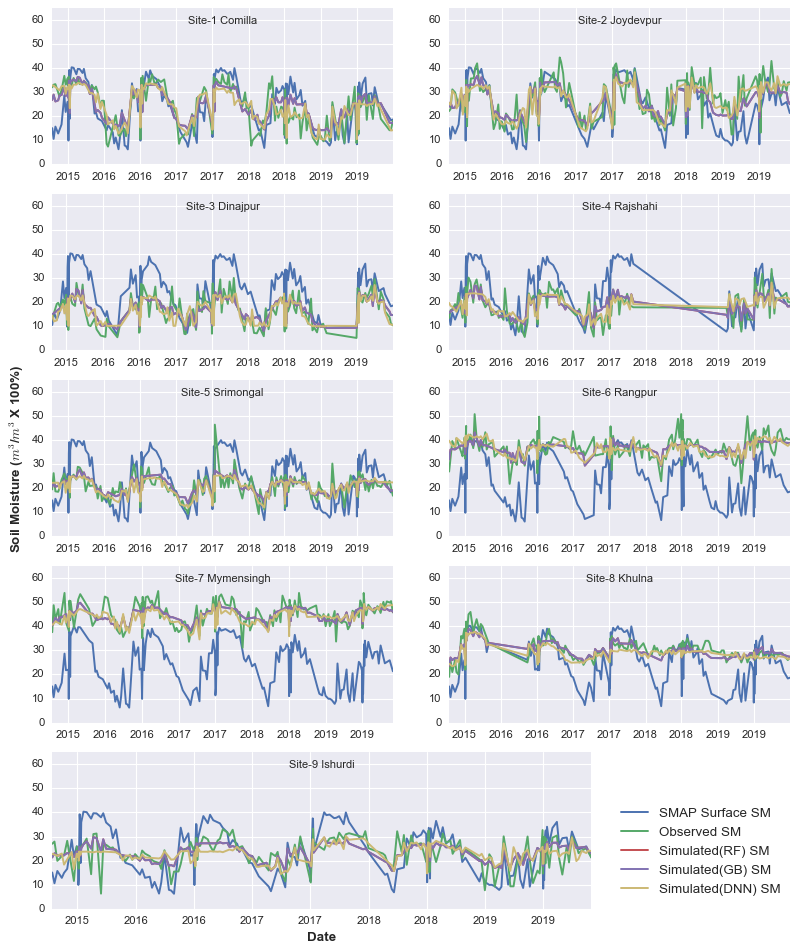

Plotting in:  seaborn-v0_8
6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

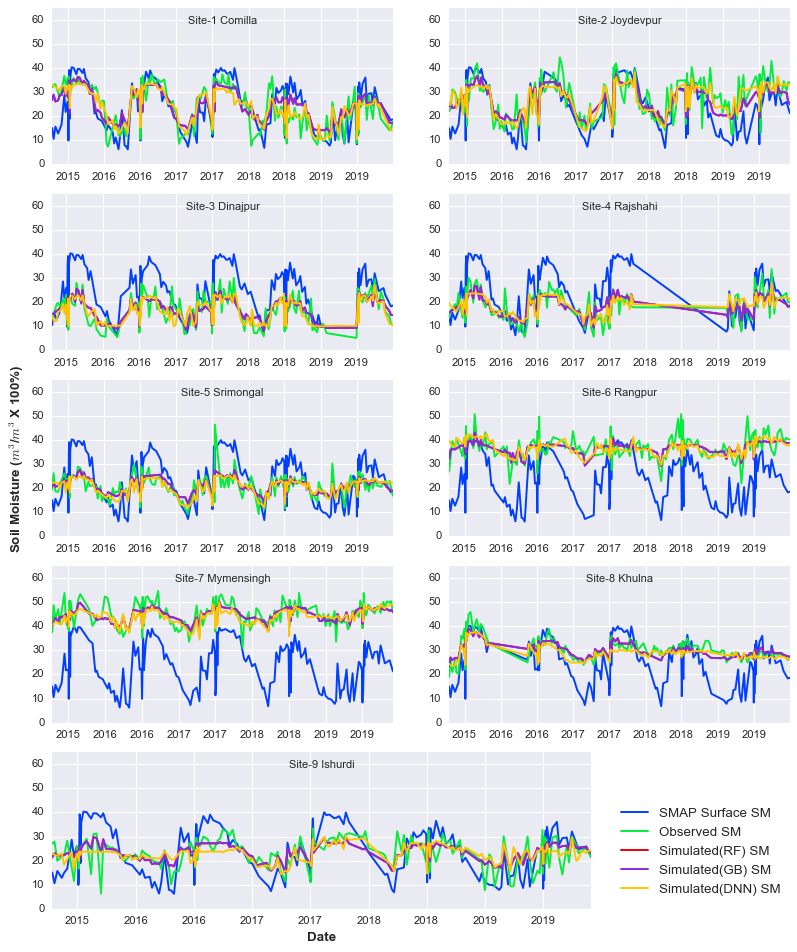

Plotting in:  seaborn-v0_8-bright
6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 994us/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

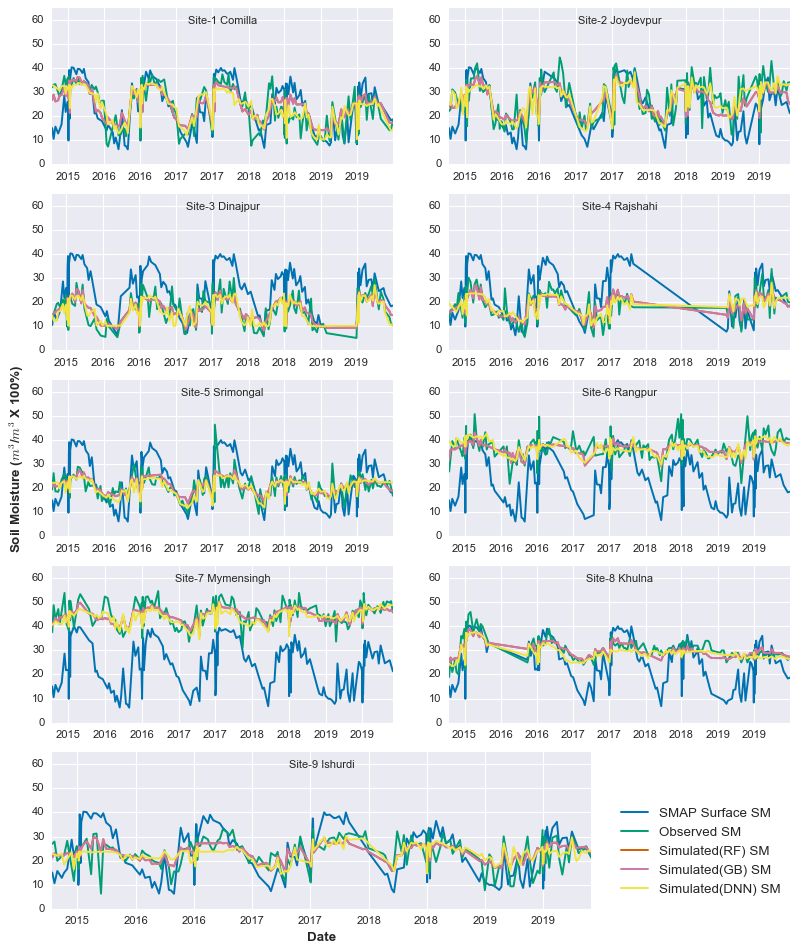

Plotting in:  seaborn-v0_8-colorblind
7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

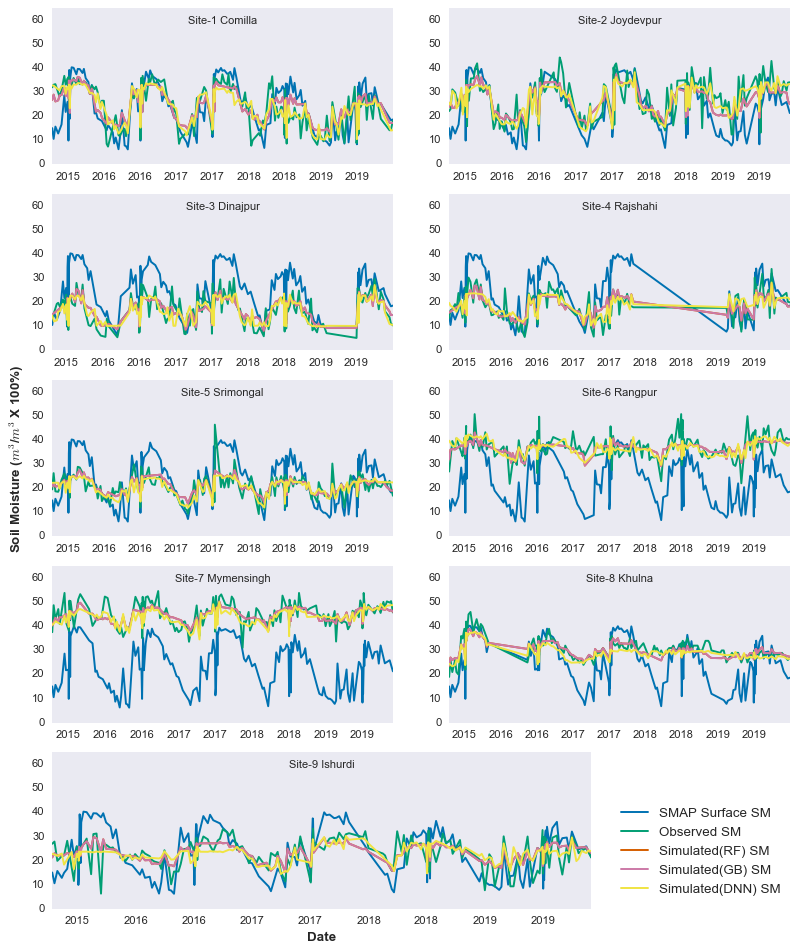

Plotting in:  seaborn-v0_8-dark
1/6 [====>.........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

1/7 [===>..........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1000us/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

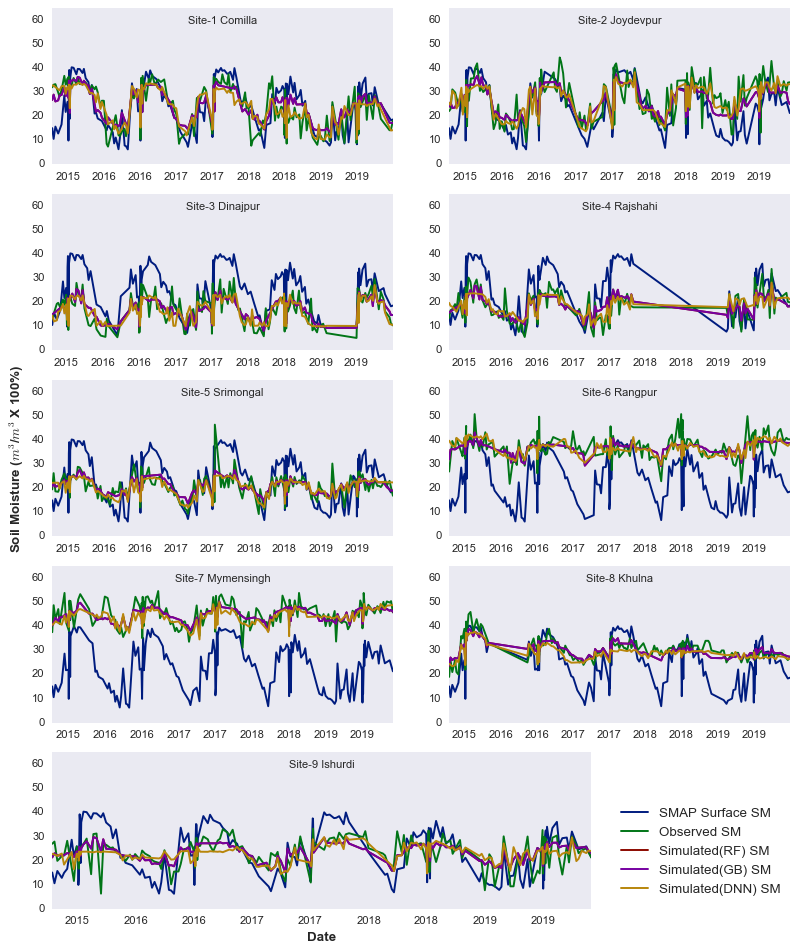

Plotting in:  seaborn-v0_8-dark-palette
6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 996us/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

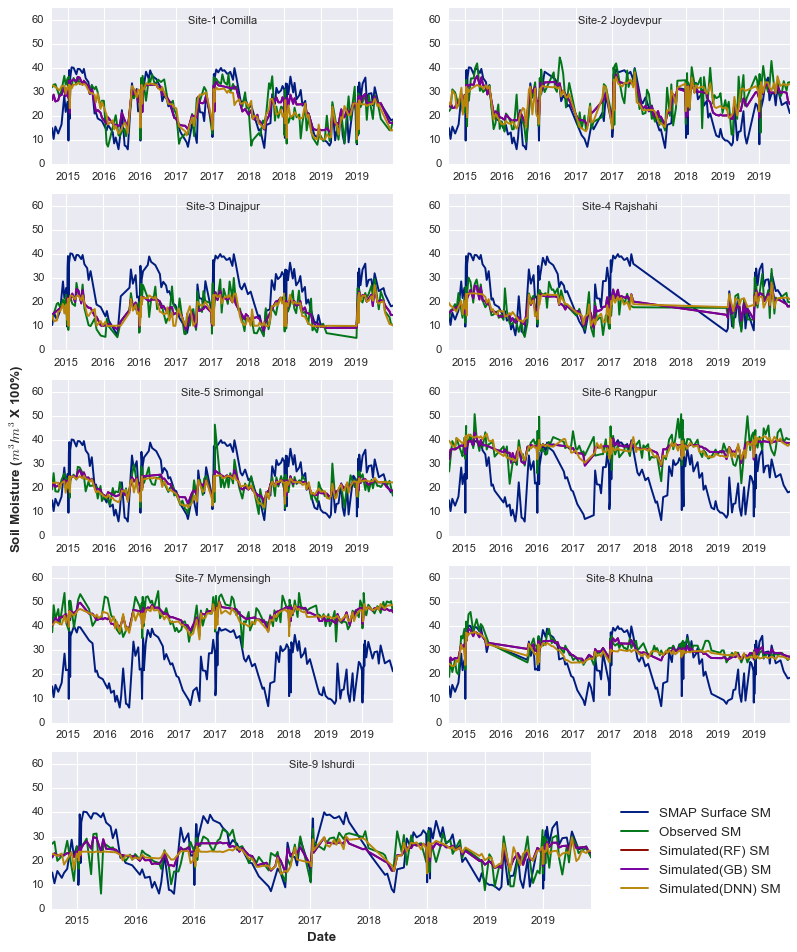

Plotting in:  seaborn-v0_8-darkgrid
6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

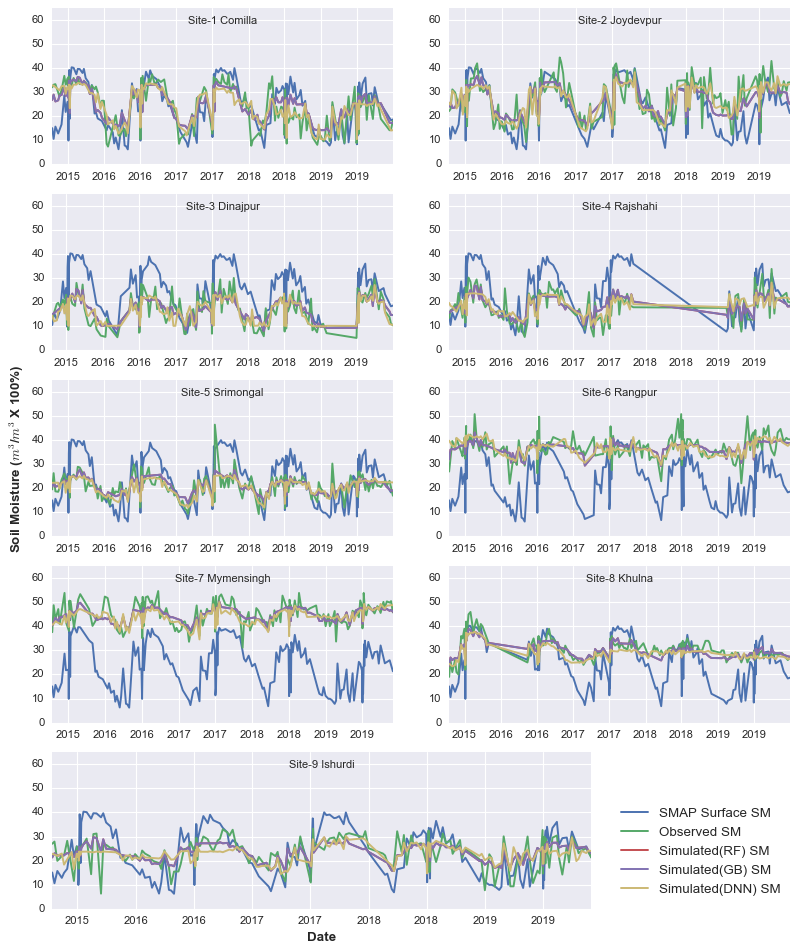

Plotting in:  seaborn-v0_8-deep
6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

1/7 [===>..........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 995us/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

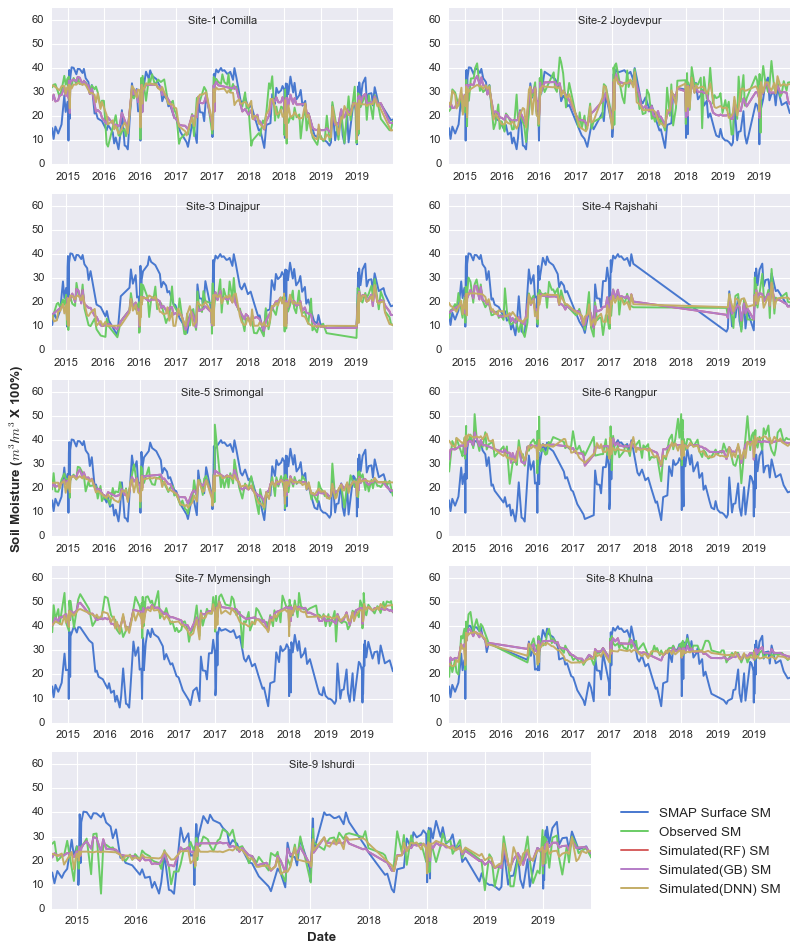

Plotting in:  seaborn-v0_8-muted
1/5 [=====>........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

1/7 [===>..........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

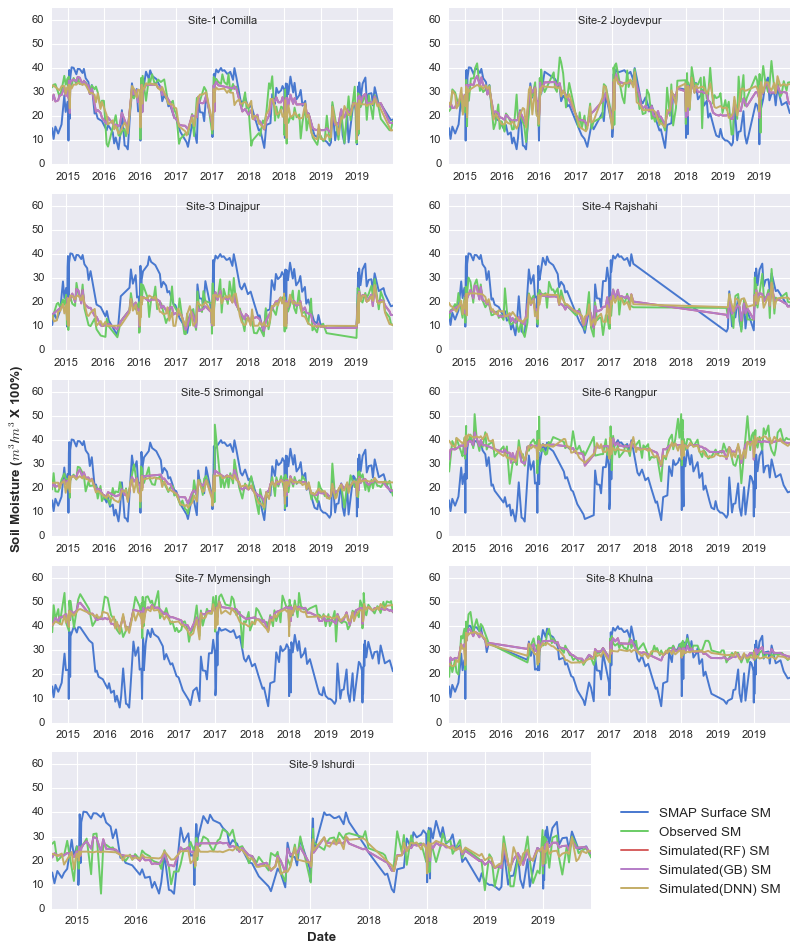

Plotting in:  seaborn-v0_8-notebook
7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

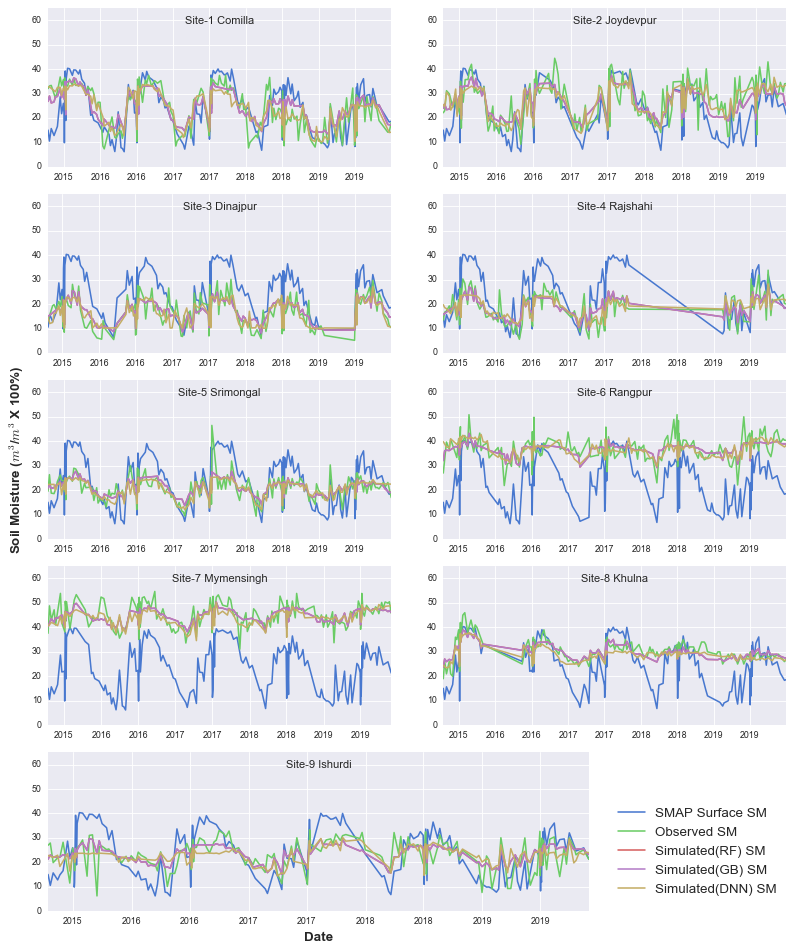

Plotting in:  seaborn-v0_8-paper
6/6 [==============================] - 0s 2ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

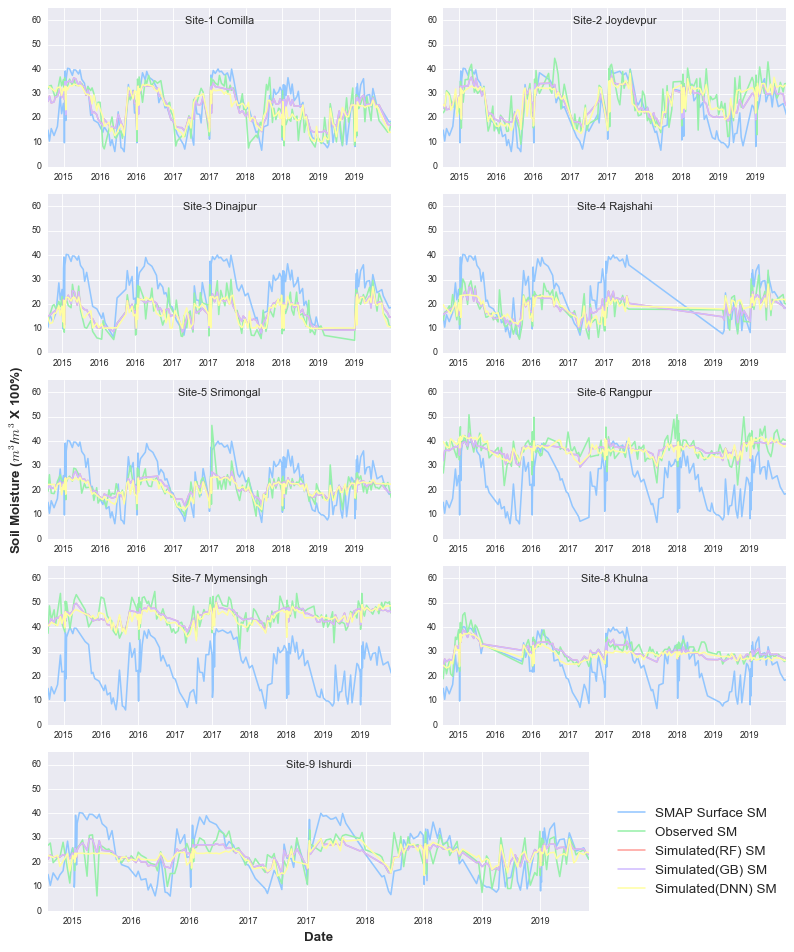

Plotting in:  seaborn-v0_8-pastel
6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 2ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

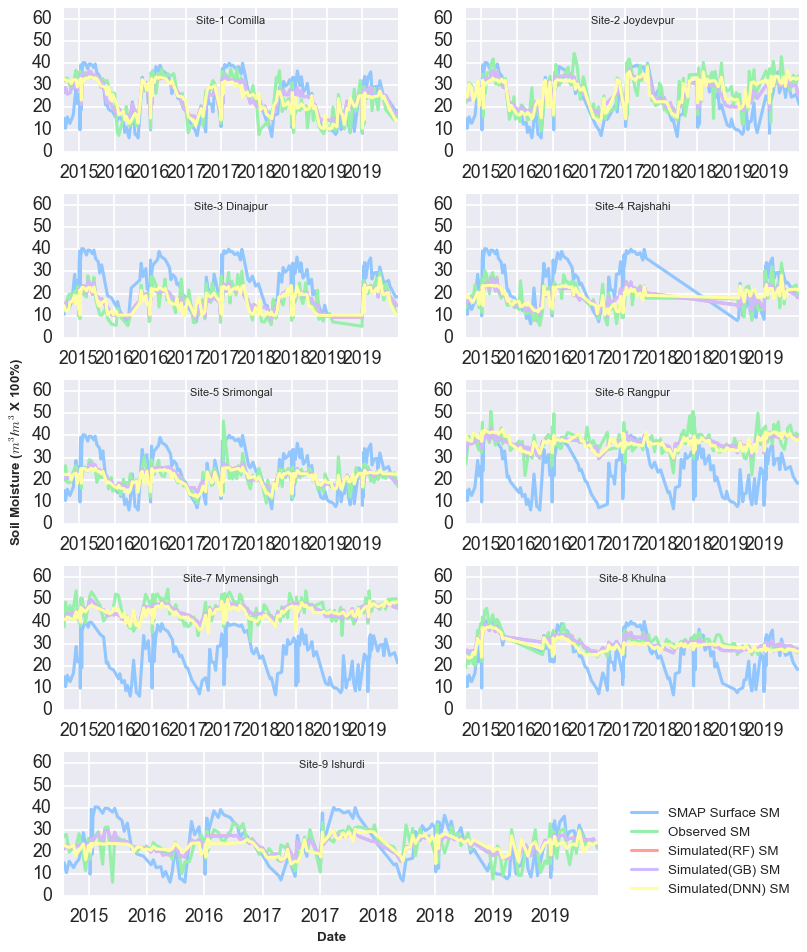

Plotting in:  seaborn-v0_8-poster
6/6 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

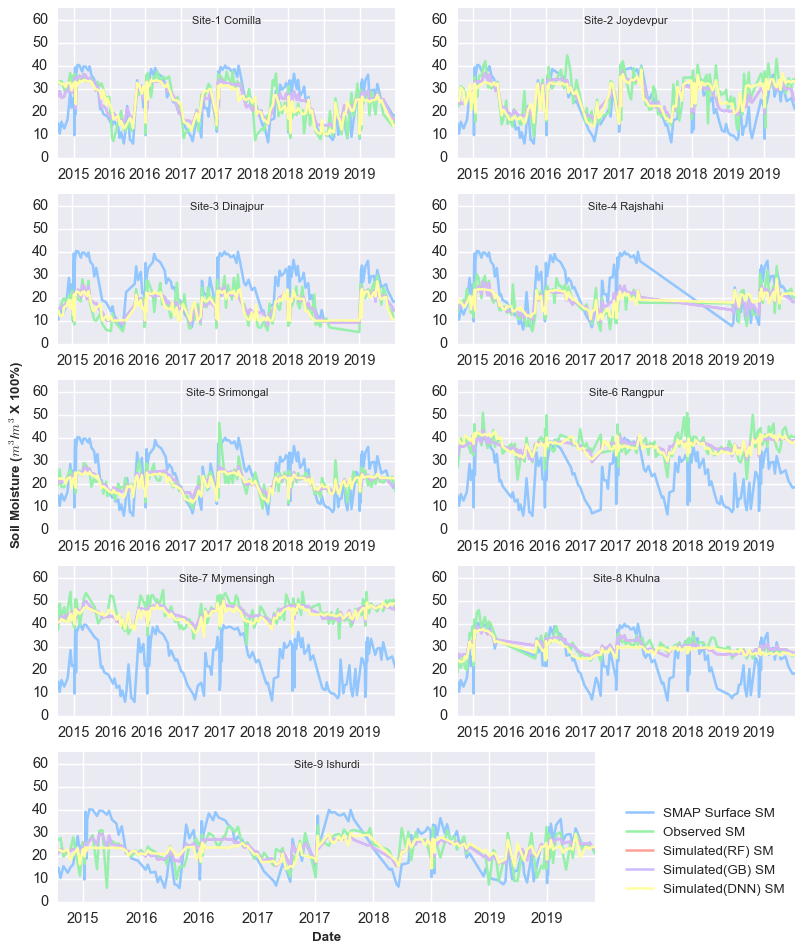

Plotting in:  seaborn-v0_8-talk
1/6 [====>.........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 1000us/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

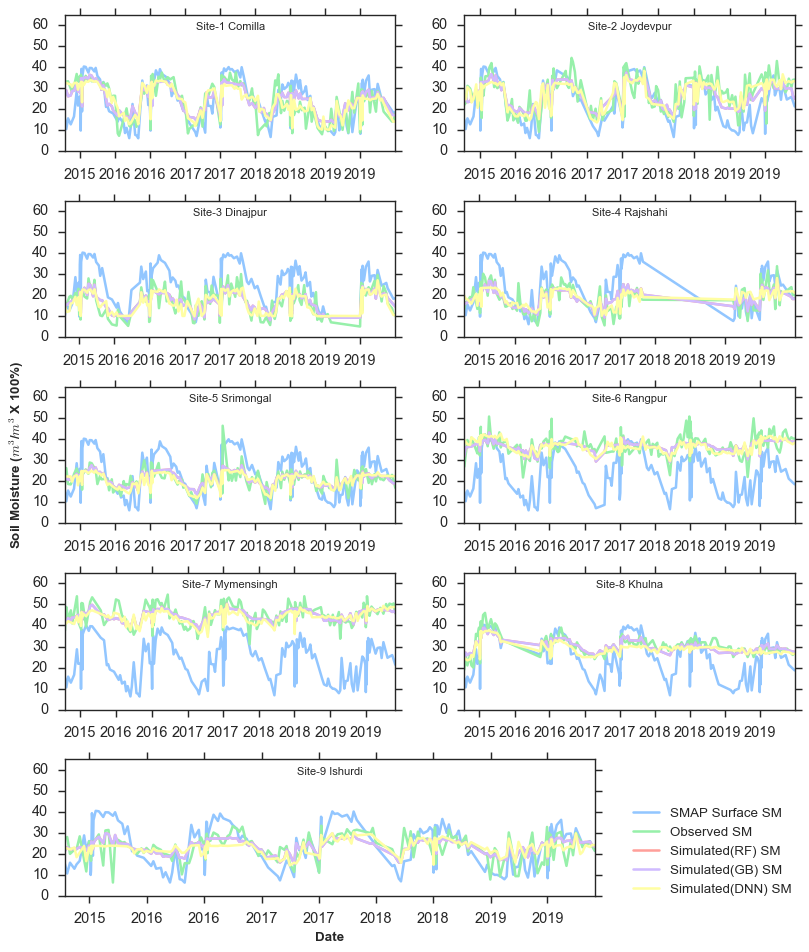

Plotting in:  seaborn-v0_8-ticks
1/6 [====>.........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

1/7 [===>..........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

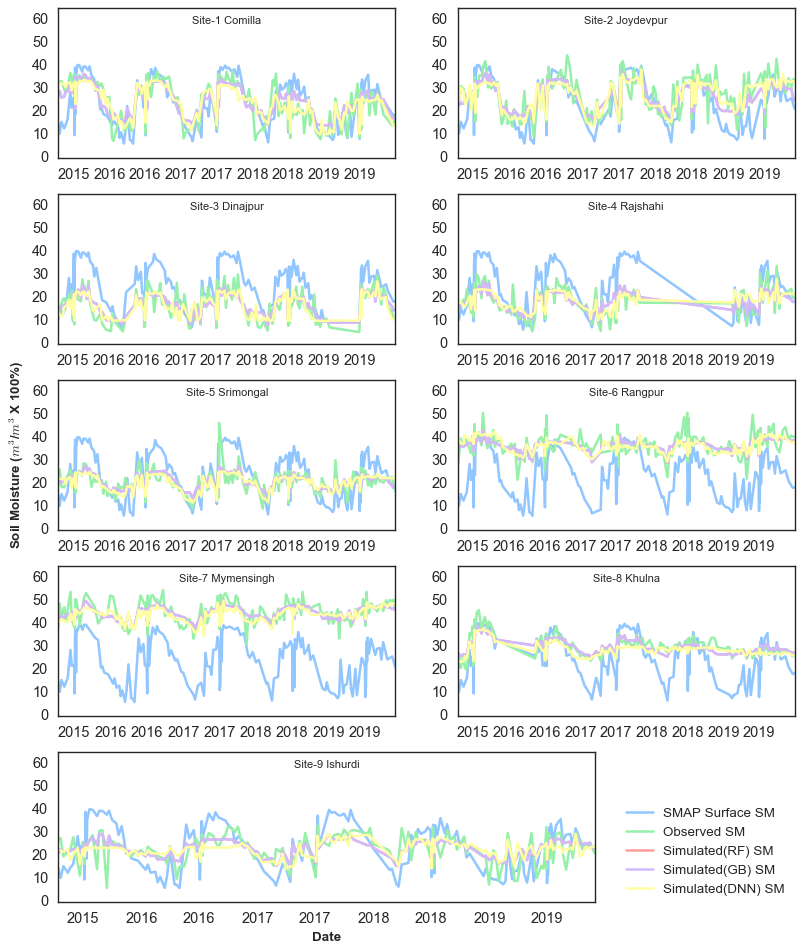

Plotting in:  seaborn-v0_8-white


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)


1/5 [=====>........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

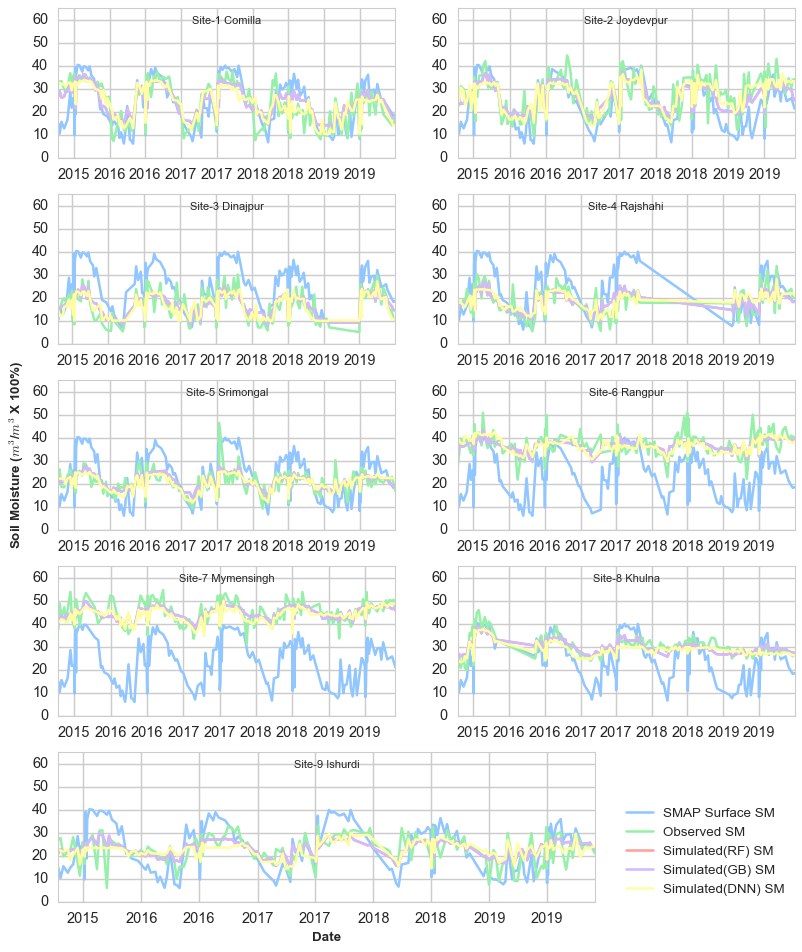

Plotting in:  seaborn-v0_8-whitegrid
1/6 [====>.........................] - ETA: 0s

C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

7/7 [==============================] - 0s 2ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

7/7 [==============================] - 0s 1ms/step


C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_dnn"] = dnn_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["sim_rf"] = gb_model.predict(var)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_14392\1194581620.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

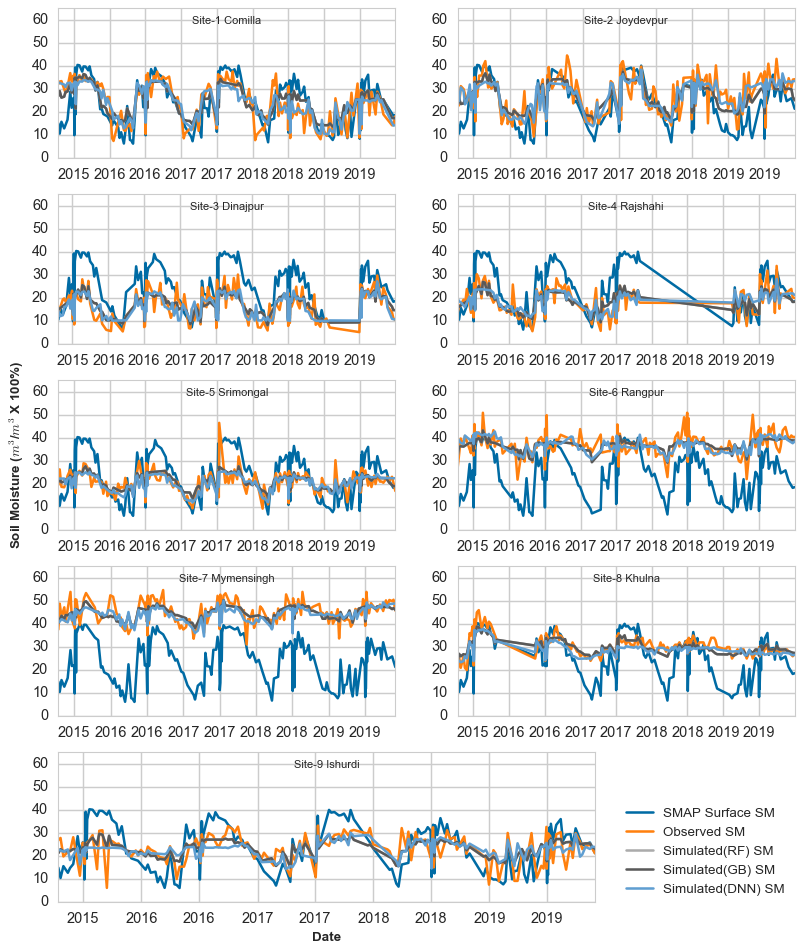

Plotting in:  tableau-colorblind10


In [52]:
import matplotlib.pyplot as plt

import matplotlib.dates as mdates

for number, color in enumerate(plt.style.available):
    plt.style.use(color)

    fig,ax = plt.subplots(figsize = (12,12))

    ax1 = plt.subplot2grid((5, 5), (0,1),colspan = 2)
    ax2 = plt.subplot2grid((5, 5), (0,3),colspan = 2)

    ax3 = plt.subplot2grid((5, 5), (1,1),colspan = 2)
    ax4 = plt.subplot2grid((5, 5), (1,3),colspan = 2)

    ax5 = plt.subplot2grid((5, 5), (2,1),colspan = 2)
    ax6 = plt.subplot2grid((5, 5), (2,3),colspan = 2)

    ax7 = plt.subplot2grid((5, 5), (3,1),colspan = 2)
    ax8 = plt.subplot2grid((5, 5), (3,3),colspan = 2)

    ax9 = plt.subplot2grid((5, 5), (4,1),colspan = 3)


    # plt.tight_layout()
    # ax1.scatter(y,dnn_predictions)

    # ax2.scatter(y,dnn_predictions)

    # ax3.scatter(y,dnn_predictions)

    for i, ax in enumerate(fig.axes):
        filt = df["Station"] == stations[i]
        temp_df = df[filt]
        temp_df["smap"] = temp_df.loc[:,["Surface_SM(m3m-3)"]]*100
        var = temp_df.drop(["Date","Station","7_day_avg_sm","Observed","smap"],axis = 1).copy()
        observed = temp_df["Observed"].copy()
        temp_df["sim_dnn"] = dnn_model.predict(var)
        temp_df["sim_rf"] = gb_model.predict(var)
        temp_df["sim_gb"] = gb_model.predict(var)


        temp_df.set_index("Date", inplace = True)
        temp_df.sort_index(inplace = True)

        ax.plot(temp_df["smap"], label = "SMAP Surface SM")
        ax.plot(temp_df["Observed"], label = "Observed SM")
        ax.plot(temp_df["sim_rf"], label = "Simulated(RF) SM")
        ax.plot(temp_df["sim_gb"], label = "Simulated(GB) SM")
        ax.plot(temp_df["sim_dnn"], label = "Simulated(DNN) SM")
        ax.set_ylim([0,65])
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        if i == 4:
            ax.set_ylabel("Soil Moisture ($m^3$/$m^3$ X 100%)", fontweight = "semibold", fontsize = 12)
        ax.set_title("Site-"+str(i+1)+" "+stations[i], y = 1, pad = -14, fontsize = 10 )


    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower right',bbox_to_anchor = (0.99,0.05),fontsize = 12)
    plt.xlabel("Date", fontweight = "semibold", fontsize = 12)
    plt.savefig("Stationwise_plot_combined_"+color+".jpg", dpi = 500,bbox_inches = 'tight')

    plt.tight_layout()
    plt.show()
    print("Plotting in: ",color)


In [43]:
for number, color in enumerate(plt.style.available):
    print(color)
    print(number)

Solarize_Light2
0
_classic_test_patch
1
_mpl-gallery
2
_mpl-gallery-nogrid
3
bmh
4
classic
5
dark_background
6
fast
7
fivethirtyeight
8
ggplot
9
grayscale
10
seaborn-v0_8
11
seaborn-v0_8-bright
12
seaborn-v0_8-colorblind
13
seaborn-v0_8-dark
14
seaborn-v0_8-dark-palette
15
seaborn-v0_8-darkgrid
16
seaborn-v0_8-deep
17
seaborn-v0_8-muted
18
seaborn-v0_8-notebook
19
seaborn-v0_8-paper
20
seaborn-v0_8-pastel
21
seaborn-v0_8-poster
22
seaborn-v0_8-talk
23
seaborn-v0_8-ticks
24
seaborn-v0_8-white
25
seaborn-v0_8-whitegrid
26
tableau-colorblind10
27
